In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Diffusion of Cosmic Rays with a Stochastic Differential Equation

We are going to simulate the movement of cosmic rays in the interstellar medium assuming that, on large scales, their transport can be approximated by the diffusion equation:

$$
\frac{\partial n(x,t)}{\partial t}
=
D \frac{\partial^2 n(x,t)}{\partial x^2}
$$

where:

- $n(x,t)$ is the cosmic-ray density  
- $D$ is the spatial diffusion coefficient  
- $x$ is the spatial coordinate  
- $t$ is time  

Here, we solve this equation using a **stochastic differential equation (SDE)** approach instead of directly solving the diffusion equation.

---

## 1. From the Diffusion Equation to an SDE

The diffusion equation is mathematically equivalent to the stochastic process:

$$
dx = \sqrt{2D}\, dW_t
$$

where:

- $dW_t$ is a Wiener process (Gaussian noise)
- $\langle dW_t \rangle = 0$
- $\langle dW_t^2 \rangle = dt$

This implies:

$$
\langle x^2 \rangle = 2Dt
$$

Instead of solving for the density $n(x,t)$ directly, we simulate many particles whose positions evolve stochastically. 

---

## 2. Numerical Scheme (Euler–Maruyama)

We discretize time:

$$
t \rightarrow t + dt
$$

The stochastic update becomes:

$$
x_{i+1} = x_i + \sqrt{2D\,dt} \, \mathcal{N}(0,1)
$$

where $\mathcal{N}(0,1)$ is a Gaussian random variable.

This is the **Euler–Maruyama scheme**, the stochastic analogue of Euler integration.

---

## 3. Physical Interpretation

In the cosmic-ray context:

- Each particle represents a cosmic ray  
- All particles are injected at $x = 0$ 
- Scattering with plasma waves causes random motion  
- At large scales, the transport becomes diffusive  

The analytic solution for instantaneous injection is:

$$
n(x,t) =
\frac{1}{\sqrt{4\pi D t}}
\exp\left(-\frac{x^2}{4Dt}\right)
$$

This is a Gaussian whose width grows as:

$$
\sigma = \sqrt{2Dt}
$$




In [25]:
# Physical parameters (Galactic CR-like scales, simplified)
D = 1.0        # diffusion coefficient (kpc^2 / Myr)
T = 1.0        # total time (Myr)
dt = 1e-3      # timestep
N = 50000      # number of particles

n_steps = int(T/dt)
sqrt_term = np.sqrt(2 * D * dt)


In [26]:
# Initialize
x = np.zeros(N)

snapshots = []
times_to_store = [0.1, 0.3, 0.6, 1.0]
store_indices = [int(t/dt) for t in times_to_store]

# Time evolution
for i in range(n_steps):
    dW = np.random.normal(0.0, 1.0, N)
    x += sqrt_term * dW
    
    if i in store_indices:
        snapshots.append(x.copy())

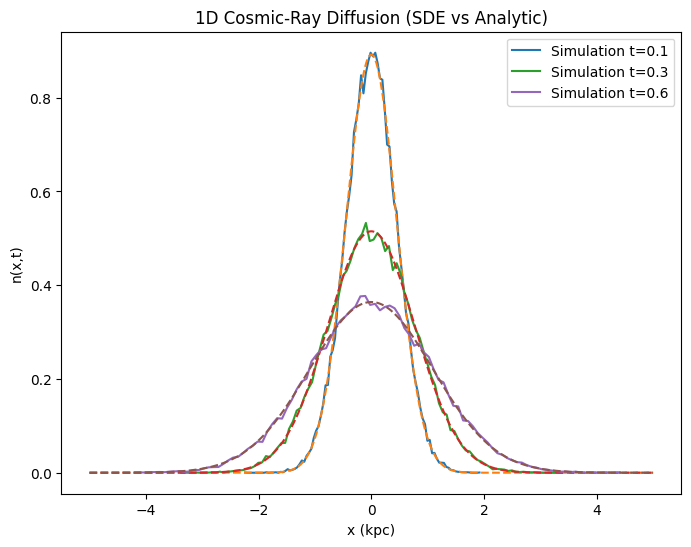

In [27]:
x_grid = np.linspace(-5, 5, 500)

plt.figure(figsize=(8,6))

for i, snap in enumerate(snapshots):
    t = times_to_store[i]
    
    # Histogram (normalized)
    hist, bins = np.histogram(snap, bins=100, density=True)
    centers = 0.5 * (bins[1:] + bins[:-1])
    
    plt.plot(centers, hist, label=f"Simulation t={t}")
    
    # Analytic solution
    analytic = (1/np.sqrt(4*np.pi*D*t)) * \
               np.exp(-x_grid**2/(4*D*t))
    
    plt.plot(x_grid, analytic, '--')

plt.xlabel("x (kpc)")
plt.ylabel("n(x,t)")
plt.legend()
plt.title("1D Cosmic-Ray Diffusion (SDE vs Analytic)")
plt.show()

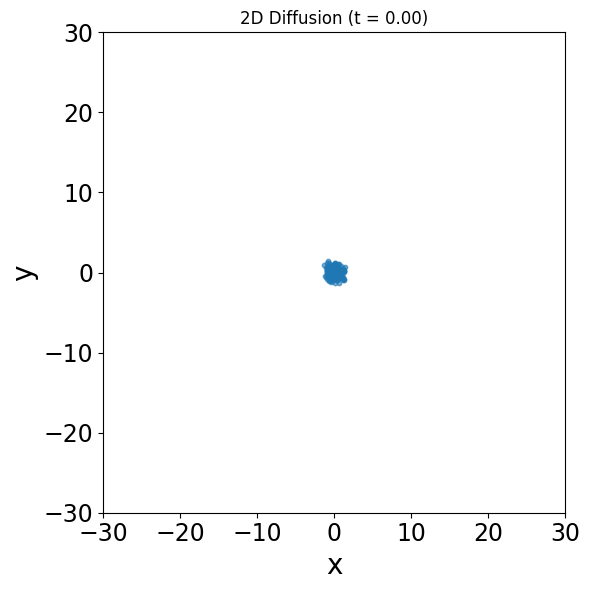

In [6]:
# -----------------------
# Parameters
# -----------------------
N = 500          # number of particles
T = 200          # number of time steps
D = 1.0          # diffusion coefficient
dt = 0.1         # time step
sigma = np.sqrt(2 * D * dt)

# -----------------------
# Initialize particles at (0,0)
# -----------------------
x = np.zeros(N)
y = np.zeros(N)

# -----------------------
# Setup figure
# -----------------------
fig, ax = plt.subplots(figsize=(6, 6))
scat = ax.scatter(x, y, s=10, alpha=0.6)

ax.set_xlim(-30, 30)
ax.set_ylim(-30, 30)
ax.set_title("2D Diffusion from Point Source")
ax.set_xlabel("x", fontsize=20)
ax.set_ylabel("y", fontsize=20)
ax.tick_params(axis='both', labelsize=17)  # increase tick number size
plt.tight_layout()

# -----------------------
# Update function
# -----------------------
def update(frame):
    global x, y
    
    # Random Gaussian steps (Brownian motion)
    x += np.random.normal(0, sigma, N)
    y += np.random.normal(0, sigma, N)
    
    scat.set_offsets(np.column_stack((x, y)))
    ax.set_title(f"2D Diffusion (t = {frame*dt:.2f})")
    
    return scat,

# -----------------------
# Animate
# -----------------------
ani = FuncAnimation(fig, update, frames=T, interval=50)

#plt.show()

In [7]:
ani.save("diffusion.gif", writer="pillow", fps=30)

In [5]:
%matplotlib inline  # activates the inline backend
from IPython.display import HTML

ani = FuncAnimation(fig, update, frames=T, interval=50)

HTML(ani.to_jshtml())

In [ ]:
%matplotlib notebook

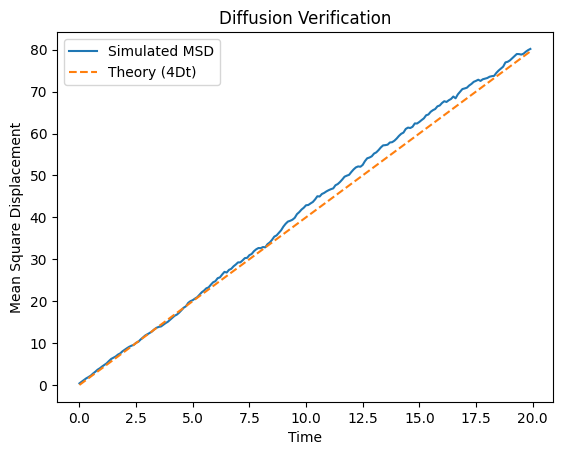

In [7]:
# Compute mean square displacement over time
msd = []

x = np.zeros(N)
y = np.zeros(N)

for t in range(T):
    x += np.random.normal(0, sigma, N)
    y += np.random.normal(0, sigma, N)
    msd.append(np.mean(x**2 + y**2))

time = np.arange(T) * dt

plt.figure()
plt.plot(time, msd, label="Simulated MSD")
plt.plot(time, 4 * D * time, '--', label="Theory (4Dt)")
plt.xlabel("Time")
plt.ylabel("Mean Square Displacement")
plt.legend()
plt.title("Diffusion Verification")
plt.show()

### 2D diffusion

In [89]:
N_particles = 7       # number of particles
T = 1.0                 # total time [Myr]
dt = 3e-3               # timestep [Myr]
n_steps = int(T/dt)

# Diffusion coefficient parameters
D0 = 0.15              # kpc^2/Myr (~4.4e28 cm^2/s)
E0 = 4.0                # GeV
delta = 0.5             # energy dependence

# Particle energies (all same energy)
E = 100 # GeV
E_particles = np.ones(N_particles)*E


# ------------------
# Initialize particles at r=0, z=0
# ------------------
r = np.zeros(N_particles)
z = np.zeros(N_particles)

# Trajectory storage
r_traj = np.zeros((N_particles, n_steps))
z_traj = np.zeros((N_particles, n_steps))

# ------------------
# Time evolution: 2D diffusion (r, z)
# ------------------
for i in range(n_steps):
    D_particles = D0 * (E_particles / E0)**delta
    sqrt_term = np.sqrt(2 * D_particles * dt)
    
    # Diffusion steps in r and z
    dr = sqrt_term * np.random.normal(0.0, 1.0, N_particles)
    dz = sqrt_term * np.random.normal(0.0, 1.0, N_particles)
    
    r += dr
    z += dz
    
    # Store trajectories
    r_traj[:, i] = r
    z_traj[:, i] = z


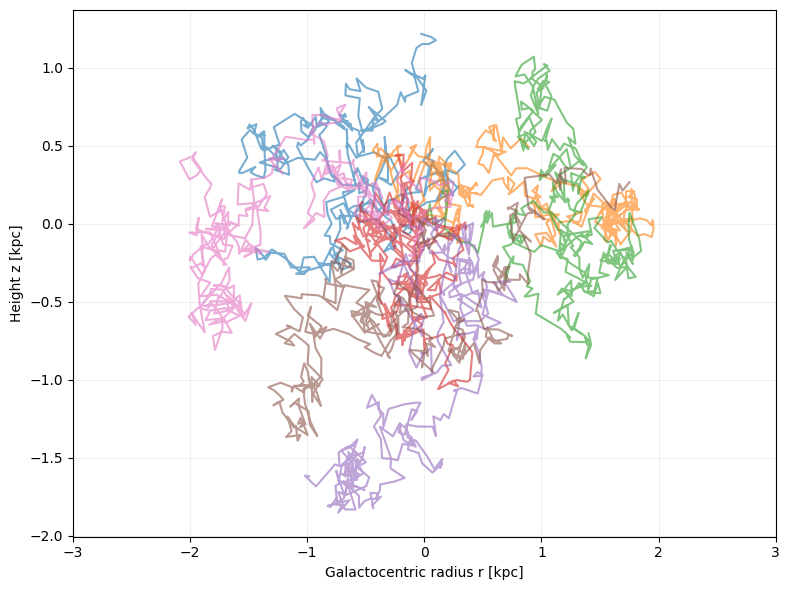

In [90]:
# ------------------
# Plot r vs z trajectories
# ------------------
plt.figure(figsize=(8,6))
for i in range(N_particles):
    plt.plot(r_traj[i,:], z_traj[i,:], alpha=0.6)


plt.xlabel("Galactocentric radius r [kpc]")
plt.ylabel("Height z [kpc]")
#plt.title("2D Trajectories of {} Cosmic Rays Injected at Galactic Center".format(N_particles))
plt.xlim(-3, +3)
plt.grid(True, alpha=0.2)
plt.tight_layout()
plt.savefig('CR_Trajectories.png')
plt.show()

### 2D Stochastic interactions, with a characteristic time going as a power-law instead of a diffusion coefficient

In [68]:
# ------------------
# Simulation parameters
# ------------------
N_particles = 50000
dt = 1e-5 # Myr
n_steps = 100 #int(T/dt)

# ------------------
# Scattering parameters
# ------------------
tau0 = 5e-8      # Myr
E0 = 4.0          # GeV
delta = 0.5

# particle energy
E = 100 # GeV
E_particles = np.ones(N_particles)*E

# particle speed (speed of light in kpc/Myr)
Myr_to_sec = 3.15576e13
kpc_to_m = 3.236e-20
c = 3e8 * Myr_to_sec*kpc_to_m  # c = 306.6 kpc/Myr

# ------------------
# Initial positions
# ------------------
r = np.zeros(N_particles)
z = np.zeros(N_particles)

# random initial directions
theta = np.random.uniform(0, 2*np.pi, N_particles)

# trajectory storage
r_traj = np.zeros((N_particles, n_steps))
z_traj = np.zeros((N_particles, n_steps))

# ------------------
# Time evolution
# ------------------
for i in range(n_steps):
    # store trajectories
    r_traj[:, i] = r
    z_traj[:, i] = z
    
    # scattering time
    tau_particles = tau0 * (E_particles/E0)**delta

    # probability of scattering in timestep
    P_scatter = dt / tau_particles

    # decide which particles scatter
    scatter = np.random.rand(N_particles) < P_scatter

    # randomize direction for those that scatter
    theta[scatter] = np.random.uniform(0, 2*np.pi, np.sum(scatter))

    # Changing angle
    r += c * dt * np.cos(theta)


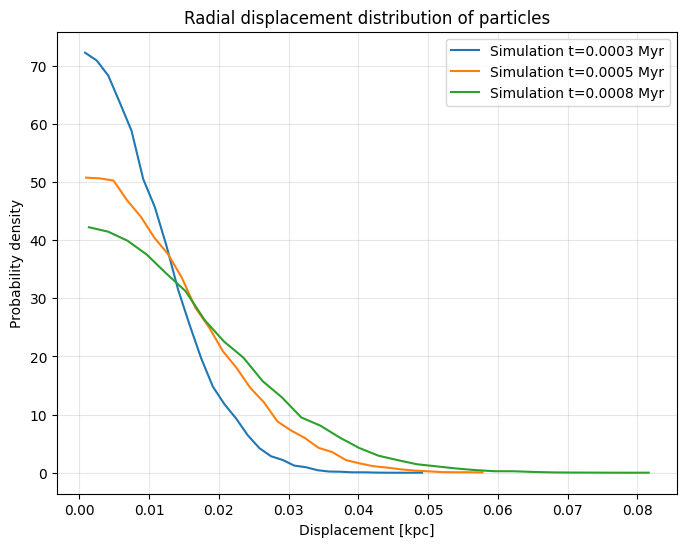

In [71]:
# --- Compute displacements ---
displacements = np.sqrt(r_traj**2 + z_traj**2)

# --- Pick snapshots to visualize ---
snapshots_idx = [n_steps//4, n_steps//2, 3*n_steps//4]  # indices of time steps
times_to_store = [dt*i for i in snapshots_idx]

# Grid for analytic Gaussian
x_grid = np.linspace(0, displacements.max()*1.2, 500)

plt.figure(figsize=(8,6))

for i, idx in enumerate(snapshots_idx):
    snap = displacements[:, idx]
    t = times_to_store[i]
    
    # Histogram (normalized)
    hist, bins = np.histogram(snap, bins=30, density=True)
    centers = 0.5*(bins[1:] + bins[:-1])
    plt.plot(centers, hist, label=f"Simulation t={t:.4f} Myr")

plt.xlabel("Displacement [kpc]")
plt.ylabel("Probability density")
plt.title("Radial displacement distribution of particles")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [66]:
### Visualize now the trajectories

# ------------------
# Simulation parameters
# ------------------
N_particles = 30
dt = 1e-4 # Myr
n_steps = 20 #int(T/dt)

# ------------------
# Scattering parameters
# ------------------
tau0 = 1e-7      # Myr
E0 = 4.0          # GeV
delta = 0.5

# particle energy
E = 100
E_particles = np.ones(N_particles)*E

# particle speed (speed of light in kpc/Myr)
Myr_to_sec = 3.15576e13
kpc_to_m = 3.236e-20
c = 3e8 * Myr_to_sec*kpc_to_m  # c = 306.6

# ------------------
# Initial positions
# ------------------
r = np.zeros(N_particles)
z = np.zeros(N_particles)

# random initial directions
theta = np.random.uniform(0, 2*np.pi, N_particles)

# trajectory storage
r_traj = np.zeros((N_particles, n_steps))
z_traj = np.zeros((N_particles, n_steps))

# ------------------
# Time evolution
# ------------------
for i in range(n_steps):
    # store trajectories
    r_traj[:, i] = r
    z_traj[:, i] = z
    
    # scattering time
    tau_particles = tau0 * (E_particles/E0)**delta

    # probability of scattering in timestep
    P_scatter = dt / tau_particles

    # decide which particles scatter
    scatter = np.random.rand(N_particles) < P_scatter

    # randomize direction for those that scatter
    theta[scatter] = np.random.uniform(0, 2*np.pi, np.sum(scatter))

    # Changing angle
    r += c * dt * np.cos(theta)
    z += c * dt * np.sin(theta)


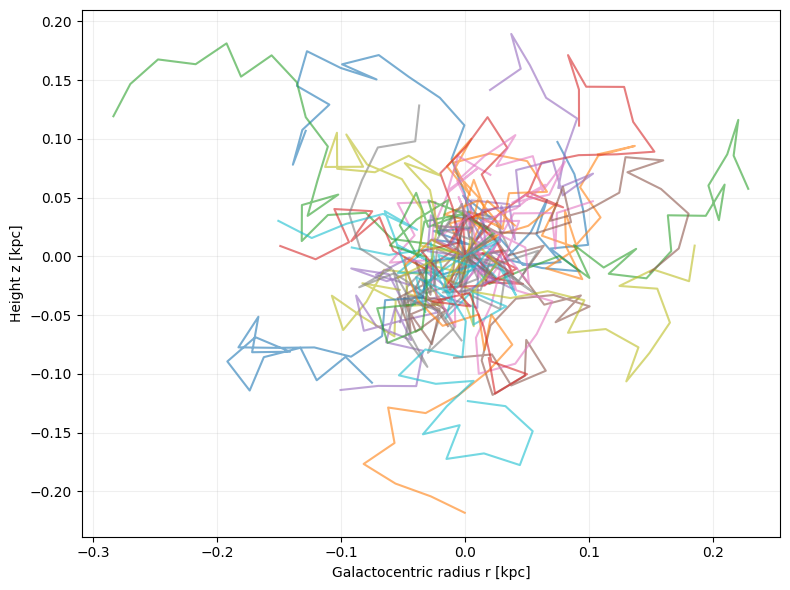

In [67]:
# ------------------
# Plot single trajectories
# ------------------
plt.figure(figsize=(8,6))

for i in range(N_particles):
    plt.plot(r_traj[i,:], z_traj[i,:], alpha=0.6)

plt.xlabel("Galactocentric radius r [kpc]")
plt.ylabel("Height z [kpc]")
#plt.xlim(-3,3)
plt.grid(True, alpha=0.2)

plt.tight_layout()
#plt.savefig("CR_Trajectories_scattering.png")
plt.show()

## Stochastic 1D equation with continuous injection following a power law

In [72]:
# Simulation parameters
D = 0.146       # Constant kpc^2/Myr --> 4.4×10^28 cm^2/s
# ---- Something expected for CRs at a few GeVs

T = 1.0          # total time (Myr)
dt = 1e-3        # timestep
N_total = 50000  # total number of particles

# Power-law injection parameters
E_min = 1.0      # arbitrary units
E_max = 100.0
gamma = 2.2      # injection index

# Spatial grid for plotting
x_grid = np.linspace(-5, 5, 500)

#### Sampling Particles from a Power-Law Distribution

We want to sample energies \(E\) from a **power-law probability distribution**:

$$
p(E) = C E^{-\gamma}, \quad E \in [E_\mathrm{min}, E_\mathrm{max}]
$$

where \(C\) is the normalization constant. *Excersise: Compute C*

---

##### 1. Cumulative Distribution Function (CDF)

The CDF is:

$$
F(E) = \int_{E_\mathrm{min}}^E p(E') dE' 
       = \frac{E^{1-\gamma} - E_\mathrm{min}^{1-\gamma}}{E_\mathrm{max}^{1-\gamma} - E_\mathrm{min}^{1-\gamma}}, \quad \gamma \neq 1
$$

This gives the **cumulative probability to produce a particle with an energy less than or equal to E in the interval from E$_{min}$ to E$_{max}$**. 

---

##### 2. Inverse CDF Method

The idea:

1. Sample a **uniform random number** (r in [0,1])
2. Solve F(E) = r for E

$$
r = \frac{E^{1-\gamma} - E_\mathrm{min}^{1-\gamma}}{E_\mathrm{max}^{1-\gamma}-E_\mathrm{min}^{1-\gamma}}
$$


Solve for \(E\):


\begin{aligned}
E^{1-\gamma} &= E_\mathrm{min}^{1-\gamma} + r \left(E_\mathrm{max}^{1-\gamma} - E_\mathrm{min}^{1-\gamma}\right) \\
E &= \left[ E_\mathrm{min}^{1-\gamma} + r \left(E_\mathrm{max}^{1-\gamma} - E_\mathrm{min}^{1-\gamma} \right) \right]^{\frac{1}{1-\gamma}}
\end{aligned}


In [73]:
def sample_powerlaw(N, E_min, E_max, gamma):
    """
    Sample N particles from a power-law distribution E^{-gamma}
    """
    r = np.random.uniform(0, 1, N)
    # Inverse CDF method
    if gamma != 1.0:
        alpha = 1.0 - gamma
        return (E_min**alpha + r*(E_max**alpha - E_min**alpha))**(1.0/alpha)
    else:
        # Special case gamma = 1
        return E_min * (E_max / E_min)**r

In [74]:
# Initialize arrays
x_particles = np.zeros(N_total)
E_particles = sample_powerlaw(N_total, E_min, E_max, gamma)

# Precompute SDE step
sqrt_term = np.sqrt(2 * D * dt)
n_steps = int(T/dt)

# Snapshots to save for plotting
snapshots = []
times_to_store = [0.1, 0.3, 0.6, 1.0]  # in Myr
store_indices = [int(t/dt) for t in times_to_store]

In [75]:
# ------------------
# Time evolution (Euler-Maruyama SDE)
# ------------------
for i in range(n_steps):
    # Diffusion step
    dW = np.random.normal(0.0, 1.0, N_total)
    x_particles += sqrt_term * dW
    
    # Save snapshots
    if i in store_indices:
        snapshots.append(x_particles.copy())

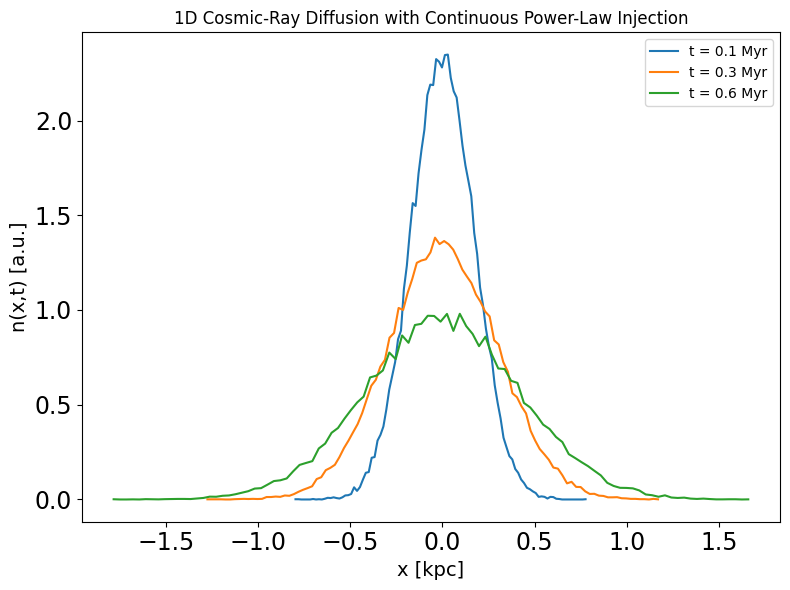

In [76]:
plt.figure(figsize=(8,6))

for i, snap in enumerate(snapshots):
    t = times_to_store[i]
    hist, bins = np.histogram(snap, bins=100, density=True)
    centers = 0.5*(bins[1:] + bins[:-1])
    plt.plot(centers, hist, label=f"t = {t} Myr")

plt.xlabel("x [kpc]", fontsize=14)
plt.ylabel("n(x,t) [a.u.]", fontsize=14)
plt.tick_params(axis='both', labelsize=17)  # increase tick number size
plt.title("1D Cosmic-Ray Diffusion with Continuous Power-Law Injection")
plt.legend()
plt.tight_layout()
plt.show()

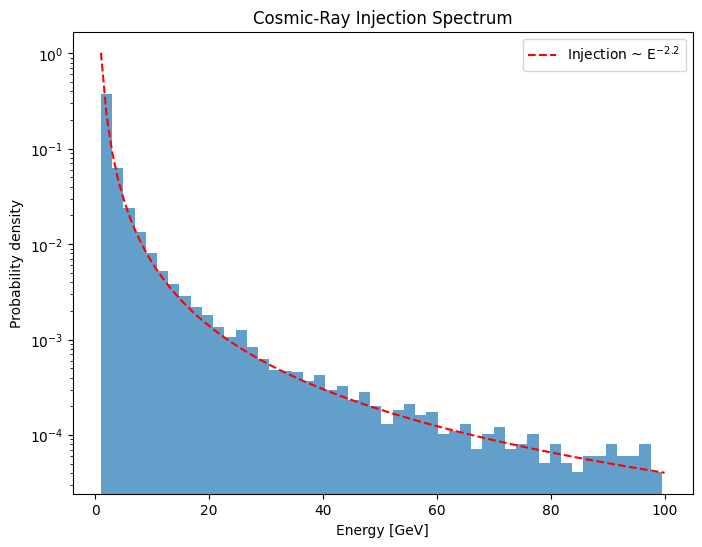

In [82]:
plt.figure(figsize=(8,6))
plt.yscale('log')
plt.hist(E_particles, bins=50, density=True, alpha=0.7)
E_vals = np.linspace(E_min, E_max, 100)
plt.plot(E_vals, E_vals**(-gamma)/np.trapezoid(E_vals**(-gamma), E_vals), 'r--', label=r'Injection ~ E$^{-' + str(gamma) + '}$')
plt.xlabel("Energy [GeV]")
plt.ylabel("Probability density")
plt.title("Cosmic-Ray Injection Spectrum")
plt.legend()
plt.show()

#### Energy-dependent diffusion coefficient

In [83]:
# ------------------
# Simulation parameters
# ------------------
T = 1.0          # total simulation time (Myr)
dt = 1e-3        # timestep
N_total = 50000  # total number of particles

# Power-law injection parameters
E_min = 1.0      # minimum energy
E_max = 100.0
gamma = 2.2      # injection index

# Diffusion coefficient parameters
D0 = 0.146       # kpc^2/Myr;  diffusion coefficient at E0 equal to 4.4×10^28 cm^2/s
E0 = 4.0         # GeV ; reference energy
delta = 0.5      # diffusion power-law index

# Spatial grid for plotting
x_grid = np.linspace(-5, 5, 500)

# ------------------
# Helper function to sample power-law energies
# ------------------
def sample_powerlaw(N, E_min, E_max, gamma):
    r = np.random.uniform(0, 1, N)
    if gamma != 1.0:
        alpha = 1.0 - gamma
        return (E_min**alpha + r*(E_max**alpha - E_min**alpha))**(1.0/alpha)
    else:
        return E_min * (E_max / E_min)**r

# ------------------
# Initialize particle positions and energies
# ------------------
x_particles = np.zeros(N_total)
E_particles = sample_powerlaw(N_total, E_min, E_max, gamma)

# Snapshots to save
snapshots = []
times_to_store = [0.1, 0.3, 0.6, 1.0]  # in Myr
store_indices = [int(t/dt) for t in times_to_store]

n_steps = int(T/dt)

# ------------------
# Time evolution with energy-dependent diffusion
# ------------------
for i in range(n_steps):
    # Compute diffusion coefficient for each particle
    D_particles = D0 * (E_particles / E0)**delta
    sqrt_term = np.sqrt(2 * D_particles * dt)
    
    # Diffusion step
    dW = np.random.normal(0.0, 1.0, N_total)
    x_particles += sqrt_term * dW
    
    # Save snapshots
    if i in store_indices:
        snapshots.append(x_particles.copy())


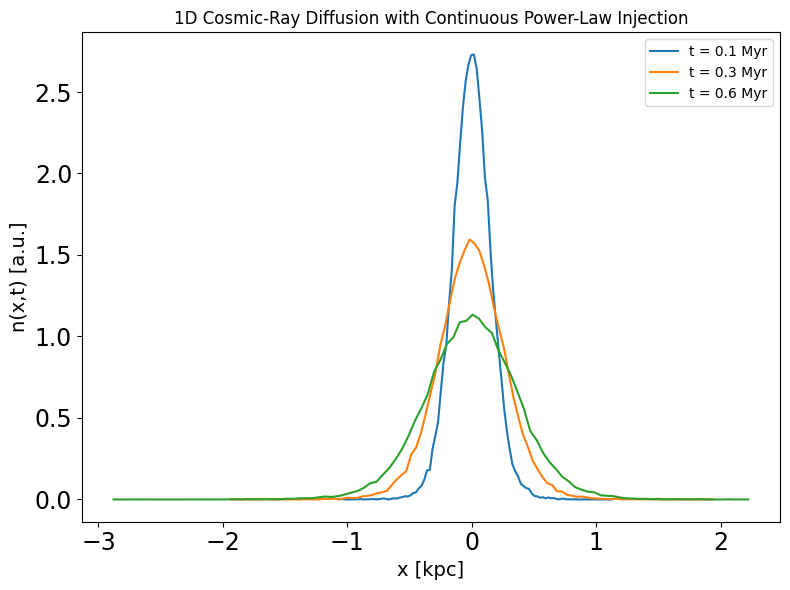

In [99]:
plt.figure(figsize=(8,6))

for i, snap in enumerate(snapshots):
    t = times_to_store[i]
    hist, bins = np.histogram(snap, bins=100, density=True)
    centers = 0.5*(bins[1:] + bins[:-1])
    plt.plot(centers, hist, label=f"t = {t} Myr")

plt.xlabel("x [kpc]", fontsize=14)
plt.ylabel("n(x,t) [a.u.]", fontsize=14)
plt.tick_params(axis='both', labelsize=17)  # increase tick number size
plt.title("1D Cosmic-Ray Diffusion with Continuous Power-Law Injection")
plt.legend()
plt.tight_layout()
plt.show()

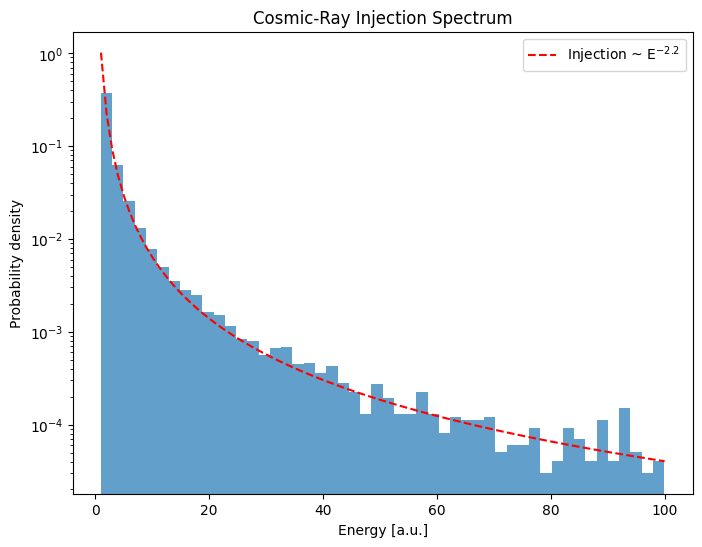

In [84]:
# ------------------
# Plot energy distribution
# ------------------
plt.figure(figsize=(8,6))
plt.yscale('log')
plt.hist(E_particles, bins=50, density=True, alpha=0.7)
E_vals = np.linspace(E_min, E_max, 100)
plt.plot(E_vals, E_vals**(-gamma)/np.trapezoid(E_vals**(-gamma), E_vals), 'r--', label=r'Injection ~ E$^{-' + str(gamma) + '}$')
plt.xlabel("Energy [a.u.]")
plt.ylabel("Probability density")
plt.title("Cosmic-Ray Injection Spectrum")
plt.legend()
plt.show()

### Injection of new particles

In [103]:
# ------------------
# Simulation parameters
# ------------------
T = 1.0          # total simulation time (Myr)
dt = 1e-3        # timestep
N_total = 5000  # total number of particles

# Power-law injection parameters
E_min = 1.0      # minimum energy
E_max = 100.0
gamma = 2.2      # injection index

# Diffusion coefficient parameters
D0 = 0.146       # kpc^2/Myr;  diffusion coefficient at E0 equal to 4.4×10^28 cm^2/s
E0 = 4.0         # GeV ; reference energy
delta = 0.5      # diffusion power-law index

# Spatial grid for plotting
x_grid = np.linspace(-5, 5, 500)

# ------------------
# Helper function to sample power-law energies
# ------------------
def sample_powerlaw(N, E_min, E_max, gamma):
    r = np.random.uniform(0, 1, N)
    if gamma != 1.0:
        alpha = 1.0 - gamma
        return (E_min**alpha + r*(E_max**alpha - E_min**alpha))**(1.0/alpha)
    else:
        return E_min * (E_max / E_min)**r

# ------------------
# Initialize particle positions and energies
# ------------------
x_particles = np.zeros(N_total)
E_particles = sample_powerlaw(N_total, E_min, E_max, gamma)

# Snapshots to save
snapshots = []
times_to_store = [0.1, 0.3, 0.6, 1.0]  # in Myr
store_indices = [int(t/dt) for t in times_to_store]

n_steps = int(T/dt)


In [107]:
# ------------------
# Time evolution with energy-dependent diffusion
# ------------------
N_history = []
for i in range(n_steps):

    D_particles = D0 * (E_particles / E0)**delta
    sqrt_term = np.sqrt(2 * D_particles * dt)

    dW = np.random.normal(0.0, 1.0, len(x_particles))
    x_particles += sqrt_term * dW

    # Continuous injection
    N_inj = int(0.01 * N_total)

    new_x = np.zeros(N_inj)
    new_E = sample_powerlaw(N_inj, E_min, E_max, gamma)

    x_particles = np.concatenate((x_particles, new_x))
    E_particles = np.concatenate((E_particles, new_E))

    N_history.append(len(x_particles))

    if i in store_indices:
        snapshots.append(x_particles.copy())

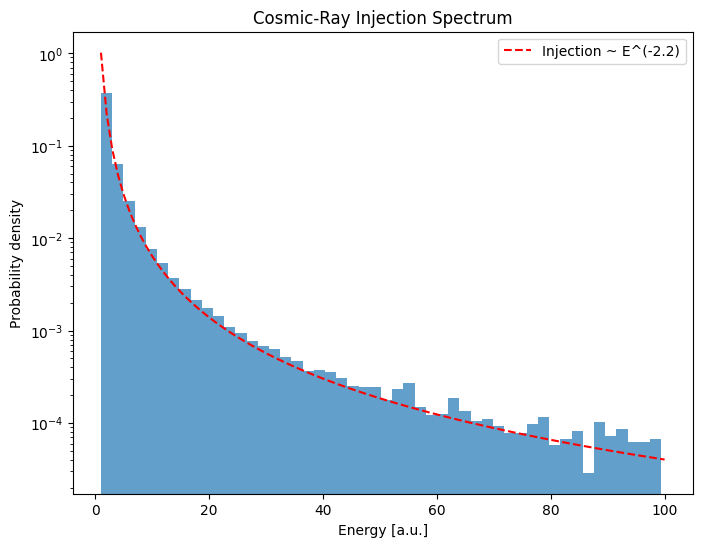

In [108]:
# ------------------
# Plot energy distribution
# ------------------
plt.figure(figsize=(8,6))
plt.yscale('log')
plt.hist(E_particles, bins=50, density=True, alpha=0.7)
E_vals = np.linspace(E_min, E_max, 100)
plt.plot(E_vals, E_vals**(-gamma)/np.trapezoid(E_vals**(-gamma), E_vals), 'r--', label=r'Injection ~ E$^{-' + str(gamma) + '}$')
plt.xlabel("Energy [a.u.]")
plt.ylabel("Probability density")
plt.title("Cosmic-Ray Injection Spectrum")
plt.legend()
plt.show()

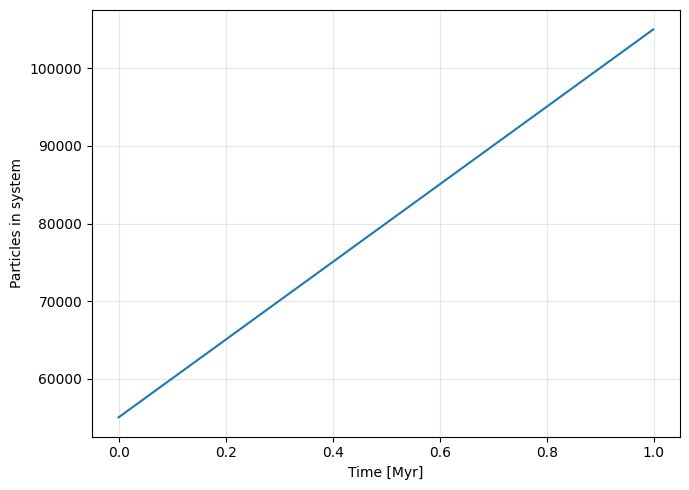

In [109]:
time = np.arange(len(N_history))*dt

plt.figure(figsize=(7,5))
plt.plot(time, N_history)

plt.xlabel("Time [Myr]")
plt.ylabel("Particles in system")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## Now including a loss term too  
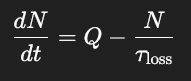

### Injection–Loss Steady State

- **Inject continuously** at a rate `Q` particles per timestep.
- **Remove stochastically** with a loss timescale $\tau_{\text{loss}}$.

---

### Injection rate

Since the timestep is $dt$, the physical injection rate is

$$
\dot N = \frac{Q}{dt}
$$

particles per unit time.

---

### Loss rate

Each particle has a probability

$$
P_{\text{loss}} = \frac{dt}{\tau_{\text{loss}}}
$$

of being removed in one timestep.

On average, the number of particles lost per unit time is therefore

$$
\frac{N}{\tau_{\text{loss}}}.
$$

---

### Evolution equation

The particle number evolves as

$$
\frac{dN}{dt} = \frac{Q}{dt} - \frac{N}{\tau_{\text{loss}}}.
$$

The first term represents **continuous injection**, while the second term represents **losses**.

---

### Steady state

A steady state is reached when

$$
\frac{dN}{dt} = 0.
$$

Solving the equation gives

$$
N_{\rm steady} = Q \frac{\tau_{\text{loss}}}{dt}.
$$

---

### Example with the simulation parameters

If

- $Q = 500$ particles in each time step
- $\tau_{\text{loss}} = 0.1\ \mathrm{Myr}$
- $dt = 10^{-3}\ \mathrm{Myr}$

then

$$
N_{\rm steady} =
500 \times \frac{0.1}{0.001}
= 50000.
$$

So the system will stabilize around **$\sim 10^5$ particles**, where **injection balances losses**.

In [126]:
# ------------------
# Simulation parameters
# ------------------
T = 1.0          # Myr
dt = 1e-3        # Myr
n_steps = int(T/dt)

# particle injection
Q = 500          # particles injected per timestep 
   ##We are not starting with a number of particles N_0 now, but injecting them continuosly 

# loss timescale
tau_loss = 0.1   # Myr

# energy distribution
E_min = 1.0
E_max = 100.0
gamma = 2.2

# ------------------
# Power-law sampler
# ------------------
def sample_powerlaw(N, E_min, E_max, gamma):

    r = np.random.uniform(0,1,N)

    if gamma != 1.0:
        alpha = 1-gamma
        return (E_min**alpha + r*(E_max**alpha-E_min**alpha))**(1/alpha)
    else:
        return E_min*(E_max/E_min)**r



In [137]:
# ------------------
# Initial particles
# ------------------
x_particles = np.zeros(0)
E_particles = np.zeros(0)

# storage
energy_snapshots = []
N_history = []

times_to_store = [0.01,0.3,0.6,1.0]
store_indices = [int(t/dt) for t in times_to_store]


# ------------------
# Time evolution
# ------------------
for i in range(n_steps):

    # ------------------
    # particle losses
    # ------------------
    if len(x_particles) > 0:

        P_loss = dt/tau_loss
        loss_mask = np.random.rand(len(x_particles)) < P_loss

        x_particles = x_particles[~loss_mask]
        E_particles = E_particles[~loss_mask]

    # ------------------
    # injection
    # ------------------
    new_x = np.zeros(Q)
    new_E = sample_powerlaw(Q, E_min, E_max, gamma)

    x_particles = np.concatenate((x_particles,new_x))
    E_particles = np.concatenate((E_particles,new_E))

    # store particle number
    N_history.append(len(x_particles))

    # store energy spectra
    if i in store_indices:
        energy_snapshots.append(E_particles.copy())


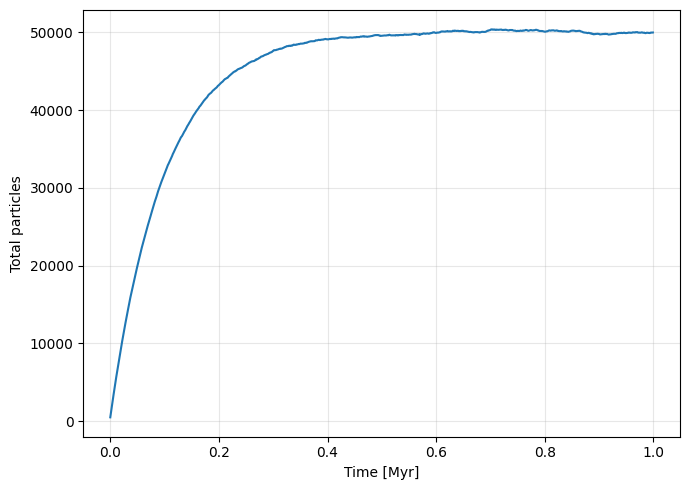

In [138]:
# ============================
# Plot 1: particle number
# ============================

time = np.arange(n_steps)*dt

plt.figure(figsize=(7,5))
plt.plot(time,N_history)

plt.xlabel("Time [Myr]")
plt.ylabel("Total particles")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


### Timescale to Reach Steady State

The particle number follows the differential equation

$$
\frac{dN}{dt} = \frac{Q}{dt} - \frac{N}{\tau_{\text{loss}}}.
$$

This equation has the analytic solution

$$
N(t) = N_{\rm steady}\left(1 - e^{-t/\tau_{\text{loss}}}\right),
$$

where

$$
N_{\rm steady} = Q \frac{\tau_{\text{loss}}}{dt}.
$$

---

### Characteristic timescale

The system approaches steady state exponentially with a **characteristic timescale**

$$
t_{\rm relax} = \tau_{\text{loss}}.
$$

This means:

| Time | Fraction of steady state reached |
|-----|----------------------------------|
| $t = \tau_{\text{loss}}$ | $1-e^{-1} \approx 63\%$ |
| $t = 2\tau_{\text{loss}}$ | $\approx 86\%$ |
| $t = 3\tau_{\text{loss}}$ | $\approx 95\%$ |
| $t = 5\tau_{\text{loss}}$ | $\approx 99\%$ |

So the system is usually considered to be in **practical steady state after about**

$$
t \sim 3\text{–}5 \, \tau_{\text{loss}}.
$$

---

### Example with the simulation parameters

If

$$
\tau_{\text{loss}} = 0.1\ \mathrm{Myr},
$$

then

- $t \approx 0.1$ Myr → ~63% of steady state  
- $t \approx 0.3$ Myr → ~95% of steady state  
- $t \approx 0.5$ Myr → ~99% of steady state  

Therefore the simulation should reach **steady state after roughly**

$$
t \sim 0.3\text{–}0.5\ \mathrm{Myr}.
$$

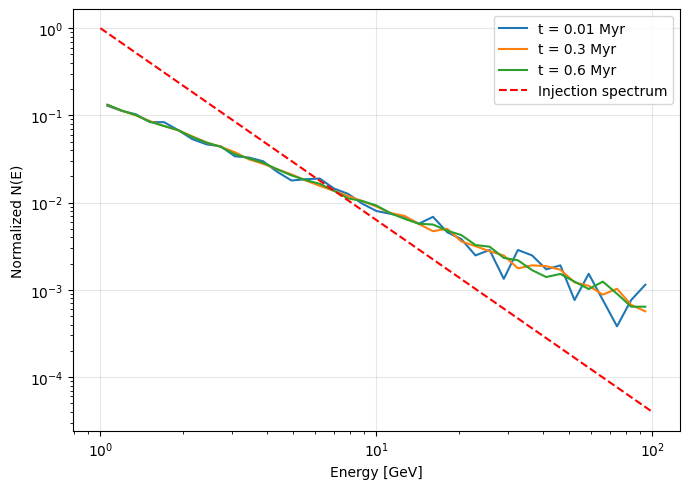

In [139]:
# ============================
# Plot 2: energy spectra
# ============================

bins = np.logspace(np.log10(E_min),np.log10(E_max),40)

plt.figure(figsize=(7,5))

for i,E_snap in enumerate(energy_snapshots):

    hist,edges = np.histogram(E_snap,bins=bins)
    centers = np.sqrt(edges[:-1]*edges[1:])

    hist = hist/np.sum(hist)

    plt.loglog(centers,hist,label=f"t = {times_to_store[i]} Myr")
plt.loglog(bins, bins**-gamma, 'r--', label='Injection spectrum')
plt.xlabel("Energy [GeV]")
plt.ylabel("Normalized N(E)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Loss term giving by particles scaping the Galaxy

In [170]:
# ------------------
# Simulation parameters
# ------------------
T = 8.0          # total simulation time [Myr]
dt = 1e-2        # timestep
n_steps = int(T/dt)

# particle injection
Q = 500          # particles injected per timestep

# energy distribution
E_min = 1.0
E_max = 100.0
gamma = 2.2

# diffusion coefficient parameters
D0 = 0.146       # kpc^2/Myr
E0 = 4.0         # GeV
delta = 0.5

# box boundaries for losses
x_max = 2.0
y_max = 0.6

# ------------------
# Power-law sampler
# ------------------
def sample_powerlaw(N, E_min, E_max, gamma):
    r = np.random.uniform(0,1,N)
    if gamma != 1.0:
        alpha = 1-gamma
        return (E_min**alpha + r*(E_max**alpha - E_min**alpha))**(1/alpha)
    else:
        return E_min*(E_max/E_min)**r


In [171]:
# ------------------
# Initialize particles
# ------------------
x_particles = np.zeros(0)
y_particles = np.zeros(0)
E_particles = np.zeros(0)

# storage for snapshots
snapshots_xy = []
energy_snapshots = []
N_history = []

times_to_store = [0.01, 0.1, 0.5, 1.0]
store_indices = [int(t/dt) for t in times_to_store]

# ------------------
# Time evolution
# ------------------
for i in range(n_steps):

    # 1) Diffusion
    if len(x_particles) > 0:
        D_particles = D0 * (E_particles / E0)**delta
        sqrt_term = np.sqrt(2 * D_particles * dt)

        dx = sqrt_term * np.random.normal(0.0,1.0,len(x_particles))
        dy = sqrt_term * np.random.normal(0.0,1.0,len(y_particles))

        x_particles += dx
        y_particles += dy

        # 2) Boundary losses
        mask_inside = (np.abs(x_particles) < x_max) & (np.abs(y_particles) < y_max)
        x_particles = x_particles[mask_inside]
        y_particles = y_particles[mask_inside]
        E_particles = E_particles[mask_inside]

    # 3) Continuous injection
    new_x = np.zeros(Q)
    new_y = np.zeros(Q)
    new_E = sample_powerlaw(Q, E_min, E_max, gamma)

    x_particles = np.concatenate((x_particles, new_x))
    y_particles = np.concatenate((y_particles, new_y))
    E_particles = np.concatenate((E_particles, new_E))

    # 4) Store info
    N_history.append(len(x_particles))
    if i in store_indices:
        snapshots_xy.append((x_particles.copy(), y_particles.copy()))
        energy_snapshots.append(E_particles.copy())


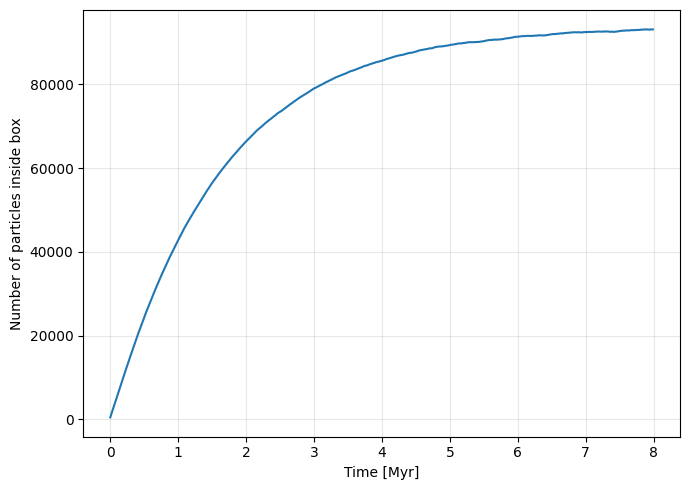

In [172]:
# ============================
# Plot 1: total particle number
# ============================
time = np.arange(n_steps)*dt

plt.figure(figsize=(7,5))
plt.plot(time,N_history)
plt.xlabel("Time [Myr]")
plt.ylabel("Number of particles inside box")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


*Can you estimate the steady-state approximate time?*

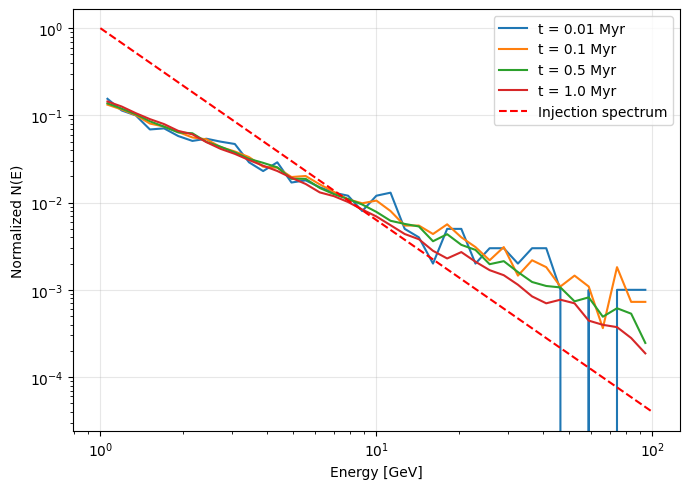

In [173]:
# ============================
# Plot 2: energy spectra at snapshots
# ============================
bins = np.logspace(np.log10(E_min), np.log10(E_max), 40)

plt.figure(figsize=(7,5))
for i,E_snap in enumerate(energy_snapshots):
    hist, edges = np.histogram(E_snap, bins=bins)
    centers = np.sqrt(edges[:-1]*edges[1:])
    hist = hist/np.sum(hist)
    plt.loglog(centers,hist,label=f"t = {times_to_store[i]} Myr")
    
plt.loglog(bins, bins**-gamma, 'r--', label='Injection spectrum')
plt.xlabel("Energy [GeV]")
plt.ylabel("Normalized N(E)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


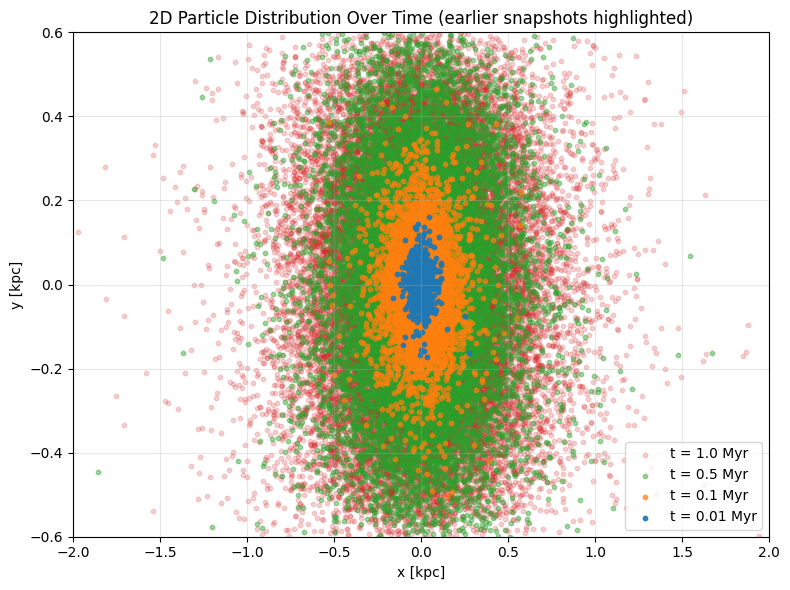

In [177]:
plt.figure(figsize=(8,6))

# Qualitative colormap
cmap = plt.get_cmap('tab10')
n_snapshots = len(snapshots_xy)

# Alpha values: start high for early snapshots, low for later ones
alpha_start = 0.9
alpha_end = 0.2

# Plot in reverse order so later snapshots are below
for idx in reversed(range(n_snapshots)):
    x_snap, y_snap = snapshots_xy[idx]
    color = cmap(idx % 10)
    # Alpha still depends on chronological order (earlier more opaque)
    alpha = alpha_start + (alpha_end - alpha_start) * (idx / (n_snapshots-1))
    plt.scatter(x_snap, y_snap, s=10, color=color, alpha=alpha, label=f"t = {times_to_store[idx]} Myr")

plt.xlabel("x [kpc]")
plt.ylabel("y [kpc]")
plt.xlim(-x_max, x_max)
plt.ylim(-y_max, y_max)
plt.title("2D Particle Distribution Over Time (earlier snapshots highlighted)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Competing Loss terms

In [197]:
# ------------------
# Simulation parameters
# ------------------
T = 8.0          # total simulation time [Myr]
dt = 1e-2        # timestep
n_steps = int(T/dt)

# particle injection
Q = 500          # particles injected per timestep

# energy distribution
E_min = 1.0
E_max = 100.0
gamma = 2.2

# diffusion coefficient parameters
D0 = 0.146       # kpc^2/Myr
E0 = 4.0         # GeV
delta = 0.5

# box boundaries for losses
x_max = 2.0
y_max = 0.6

# constant loss timescale
tau_loss = 1  # Myr

# ------------------
# Power-law sampler
# ------------------
def sample_powerlaw(N, E_min, E_max, gamma):
    r = np.random.uniform(0,1,N)
    if gamma != 1.0:
        alpha = 1-gamma
        return (E_min**alpha + r*(E_max**alpha - E_min**alpha))**(1/alpha)
    else:
        return E_min*(E_max/E_min)**r


In [198]:
# ------------------
# Initialize particles
# ------------------
x_particles = np.zeros(0)
y_particles = np.zeros(0)
E_particles = np.zeros(0)

# storage for snapshots
snapshots_xy = []
energy_snapshots = []
N_history = []

times_to_store = [0.01, 0.1, 0.5, 1.0]
store_indices = [int(t/dt) for t in times_to_store]

# ------------------
# Time evolution
# ------------------
for i in range(n_steps):

    # 1) Diffusion
    if len(x_particles) > 0:
        D_particles = D0 * (E_particles / E0)**delta
        sqrt_term = np.sqrt(2 * D_particles * dt)

        dx = sqrt_term * np.random.normal(0.0,1.0,len(x_particles))
        dy = sqrt_term * np.random.normal(0.0,1.0,len(y_particles))

        x_particles += dx
        y_particles += dy

        # 2) Boundary losses
        mask_inside = (np.abs(x_particles) < x_max) & (np.abs(y_particles) < y_max)
        x_particles = x_particles[mask_inside]
        y_particles = y_particles[mask_inside]
        E_particles = E_particles[mask_inside]

        # 3) Constant tau_loss: probabilistic removal
        P_loss = dt / tau_loss
        loss_mask = np.random.uniform(0,1,len(x_particles)) > P_loss
        x_particles = x_particles[loss_mask]
        y_particles = y_particles[loss_mask]
        E_particles = E_particles[loss_mask]

    # 4) Continuous injection
    new_x = np.zeros(Q)
    new_y = np.zeros(Q)
    new_E = sample_powerlaw(Q, E_min, E_max, gamma)

    x_particles = np.concatenate((x_particles,new_x))
    y_particles = np.concatenate((y_particles,new_y))
    E_particles = np.concatenate((E_particles,new_E))

    # 5) Store info
    N_history.append(len(x_particles))
    if i in store_indices:
        snapshots_xy.append((x_particles.copy(), y_particles.copy()))
        energy_snapshots.append(E_particles.copy())


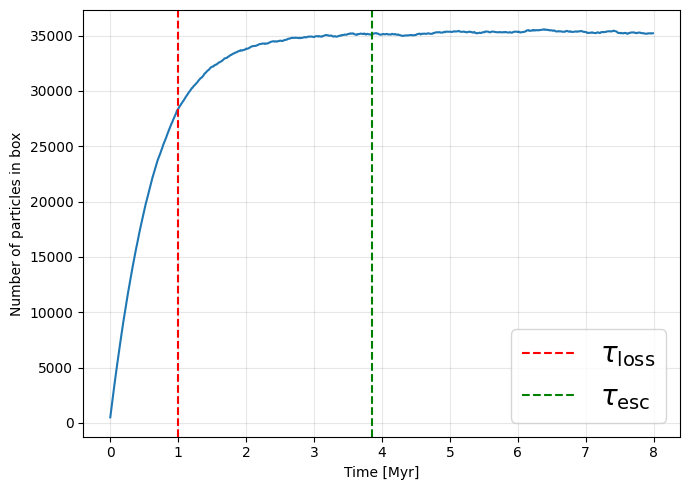

In [199]:
# Estimate escape time for diffusion in x-direction (L^2 / 2D)
# Using mean energy for estimate
E_mean = (E_min + E_max)/2
D_mean = D0 * (E_mean / E0)**delta
tau_esc = (x_max**2) / (2 * D_mean)  # in Myr



# ============================
# Example: plot number of particles over time
# ============================
time = np.arange(n_steps)*dt
plt.figure(figsize=(7,5))
plt.plot(time, N_history)

plt.axvline(tau_loss, color='r', linestyle='--', label=r"$\tau_{\rm loss}$")
plt.axvline(tau_esc, color='g', linestyle='--', label=r"$\tau_{\rm esc}$")

plt.legend(fontsize = 20)
plt.xlabel("Time [Myr]")
plt.ylabel("Number of particles in box")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()